In [11]:
from ultralytics import YOLO
import os
from pathlib import Path
import shutil

# =========================
# PATHS
# =========================
MODEL_PATH = r"D:\datashare\Model\colab_runtry\runs_20260113_202313\weights\best.pt"
SOURCE_PATH = r"D:\datashare\test\test\altitude01\longitude05\orientation01_light02.png"
OUTPUT_DIR = r"D:\datashare\yolo_output"

os.makedirs(OUTPUT_DIR, exist_ok=True)

# =========================
# IMAGE NAME BASED FOLDER
# =========================
image_name = Path(SOURCE_PATH).stem
image_output_dir = os.path.join(OUTPUT_DIR, image_name)

os.makedirs(image_output_dir, exist_ok=True)

# =========================
# LOAD MODEL
# =========================
model = YOLO(MODEL_PATH)

# =========================
# RUN PREDICTION (TEMP DIR)
# =========================
temp_project = os.path.join(OUTPUT_DIR, "_temp")

results = model.predict(
    source=SOURCE_PATH,
    imgsz=640,
    conf=0.25,
    iou=0.5,
    device="cpu",
    save=True,
    save_crop=True,
    save_txt=True,
    save_conf=True,
    line_width=2,
    project=temp_project,
    name="pred",
    verbose=True
)

# =========================
# MOVE OUTPUTS TO IMAGE DIR
# =========================
temp_result_dir = os.path.join(temp_project, "pred")

for item in os.listdir(temp_result_dir):
    src = os.path.join(temp_result_dir, item)
    dst = os.path.join(image_output_dir, item)
    shutil.move(src, dst)

# cleanup temp folder
shutil.rmtree(temp_project)

print(f"Predictions saved in: {image_output_dir}")



image 1/1 D:\datashare\test\test\altitude01\longitude05\orientation01_light02.png: 512x640 38 craters, 92.9ms
Speed: 4.1ms preprocess, 92.9ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 640)
Results saved to D:\datashare\yolo_output\_temp\pred
1 label saved to D:\datashare\yolo_output\_temp\pred\labels
Predictions saved in: D:\datashare\yolo_output\orientation01_light02


In [4]:
from ultralytics import YOLO
import os
from pathlib import Path
import shutil
# =========================
# PATHS
# =========================
MODEL_PATH = r"D:\datashare\Model\colab_runtry\runs_20260113_202313\weights\best.pt"
SOURCE_PATH = r"D:\datashare\test\test\altitude01\longitude05\orientation01_light02.png"
OUTPUT_DIR = r"D:\datashare\yolo_output"

os.makedirs(OUTPUT_DIR, exist_ok=True)

# =========================
# IMAGE NAME BASED FOLDER
# =========================
image_name = Path(SOURCE_PATH).stem
image_output_dir = os.path.join(OUTPUT_DIR, image_name)

# =========================
# CHECK IF PREDICTION EXISTS
# =========================
if os.path.exists(image_output_dir) and os.listdir(image_output_dir):
    print(f"Predictions already exist for this image at: {image_output_dir}")
    print("Please use another image to make predictions.")
else:
    os.makedirs(image_output_dir, exist_ok=True)
    
    # =========================
    # LOAD MODEL
    # =========================
    model = YOLO(MODEL_PATH)
    
    # =========================
    # RUN PREDICTION (TEMP DIR)
    # =========================
    temp_project = os.path.join(OUTPUT_DIR, "_temp")
    
    results = model.predict(
        source=SOURCE_PATH,
        imgsz=640,
        conf=0.25,
        iou=0.5,
        device="cpu",
        save=True,
        save_crop=True,
        save_txt=True,
        save_conf=True,
        line_width=2,
        project=temp_project,
        name="pred",
        verbose=True
    )
    
    # =========================
    # MOVE OUTPUTS TO IMAGE DIR
    # =========================
    temp_result_dir = os.path.join(temp_project, "pred")
    
    for item in os.listdir(temp_result_dir):
        src = os.path.join(temp_result_dir, item)
        dst = os.path.join(image_output_dir, item)
        shutil.move(src, dst)
    
    # cleanup temp folder
    shutil.rmtree(temp_project)
    
    print(f"Predictions saved in: {image_output_dir}")



image 1/1 D:\datashare\test\test\altitude01\longitude05\orientation01_light02.png: 512x640 38 craters, 217.1ms
Speed: 18.5ms preprocess, 217.1ms inference, 15.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to D:\datashare\yolo_output\_temp\pred
1 label saved to D:\datashare\yolo_output\_temp\pred\labels
Predictions saved in: D:\datashare\yolo_output\orientation01_light02


In [5]:
import cv2
import numpy as np
import os
import csv
from pathlib import Path

# =========================
# PATHS
# =========================
CROPS_DIR = r"D:\datashare\yolo_output\orientation01_light02\crops\crater"
OUTPUT_DIR = r"D:\datashare\yolo_output\orientation01_light02\ellipses"

os.makedirs(OUTPUT_DIR, exist_ok=True)

CSV_PATH = os.path.join(OUTPUT_DIR, "ellipse_params.csv")

# =========================
# CSV HEADER
# =========================
with open(CSV_PATH, "w", newline="") as f:
    writer = csv.writer(f)
    writer.writerow([
        "image",
        "center_x",
        "center_y",
        "semi_major",
        "semi_minor",
        "angle_deg"
    ])

# =========================
# PROCESS ALL IMAGES
# =========================
for img_path in Path(CROPS_DIR).glob("*.*"):

    img = cv2.imread(str(img_path), cv2.IMREAD_GRAYSCALE)
    if img is None:
        continue

    # ---------- PREPROCESS ----------
    blur = cv2.GaussianBlur(img, (7, 7), 0)
    clahe = cv2.createCLAHE(3.0, (8, 8))
    enhanced = clahe.apply(blur)

    # ---------- EDGE DETECTION ----------
    edges = cv2.Canny(enhanced, 50, 140)

    # Remove crop borders
    edges[:10, :] = 0
    edges[-10:, :] = 0
    edges[:, :10] = 0
    edges[:, -10:] = 0

    # ---------- DISTANCE TRANSFORM ----------
    inv = cv2.bitwise_not(edges)
    dist = cv2.distanceTransform(inv, cv2.DIST_L2, 5)
    dist = cv2.normalize(dist, None, 0, 1, cv2.NORM_MINMAX)

    rim_mask = (dist < 0.12).astype(np.uint8) * 255

    # ---------- COLLECT RIM POINTS ----------
    ys, xs = np.where(rim_mask > 0)
    points = np.column_stack((xs, ys))

    if len(points) < 30:
        print(f"Skipping {img_path.name} (insufficient rim points)")
        continue

    points = points.reshape(-1, 1, 2).astype(np.int32)

    # ---------- FIT ELLIPSE ----------
    ellipse = cv2.fitEllipse(points)
    (cx, cy), (W, H), angle = ellipse
    a = max(W, H) / 2.0
    b = min(W, H) / 2.0

    # ---------- OVERLAY (ELLIPSE ONLY) ----------
    overlay = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)

    # draw ellipse only
    cv2.ellipse(overlay, ellipse, (0, 255, 0), 2)

    # optional: center point (remove if not needed)
    cv2.circle(overlay, (int(cx), int(cy)), 3, (0, 0, 255), -1)

    out_img = os.path.join(
        OUTPUT_DIR,
        img_path.stem + "_ellipse.png"
    )
    cv2.imwrite(out_img, overlay)

    # ---------- SAVE PARAMETERS ----------
    with open(CSV_PATH, "a", newline="") as f:
        writer = csv.writer(f)
        writer.writerow([
            img_path.name,
            round(cx, 2),
            round(cy, 2),
            round(a, 2),
            round(b, 2),
            round(angle, 2)
        ])

    print(f"Processed: {img_path.name}")

print("Ellipse-only images saved successfully.")


Processed: orientation01_light02.jpg
Processed: orientation01_light0210.jpg
Processed: orientation01_light0211.jpg
Processed: orientation01_light0212.jpg
Processed: orientation01_light0213.jpg
Processed: orientation01_light0214.jpg
Processed: orientation01_light0215.jpg
Processed: orientation01_light0216.jpg
Processed: orientation01_light0217.jpg
Processed: orientation01_light0218.jpg
Processed: orientation01_light0219.jpg
Processed: orientation01_light022.jpg
Processed: orientation01_light0220.jpg
Processed: orientation01_light0221.jpg
Processed: orientation01_light0222.jpg
Processed: orientation01_light0223.jpg
Processed: orientation01_light0224.jpg
Processed: orientation01_light0225.jpg
Processed: orientation01_light0226.jpg
Processed: orientation01_light0227.jpg
Processed: orientation01_light0228.jpg
Processed: orientation01_light0229.jpg
Processed: orientation01_light023.jpg
Processed: orientation01_light0230.jpg
Processed: orientation01_light0231.jpg
Processed: orientation01_ligh

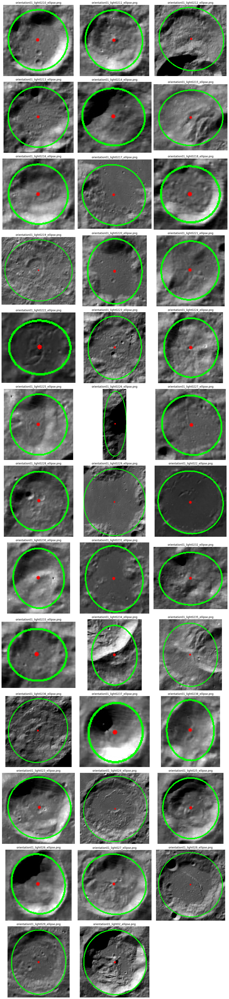

In [6]:
import cv2
from pathlib import Path
import math

import matplotlib.pyplot as plt

# Get list of ellipse images
ellipse_images = list(Path(OUTPUT_DIR).glob("*_ellipse.png"))

if not ellipse_images:
    print("No ellipse images found.")
else:
    # Calculate grid size
    n_images = len(ellipse_images)
    cols = 3
    rows = math.ceil(n_images / cols)

    plt.figure(figsize=(15, 5 * rows))

    for i, img_path in enumerate(ellipse_images):
        img = cv2.imread(str(img_path))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.title(img_path.name)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

Image size: 2592 x 2048
Loaded 38 bounding boxes
Loaded 38 ellipse parameters

Final image with all ellipses saved to: D:\datashare\yolo_output\orientation01_light02\final_ellipses_overlay.jpg


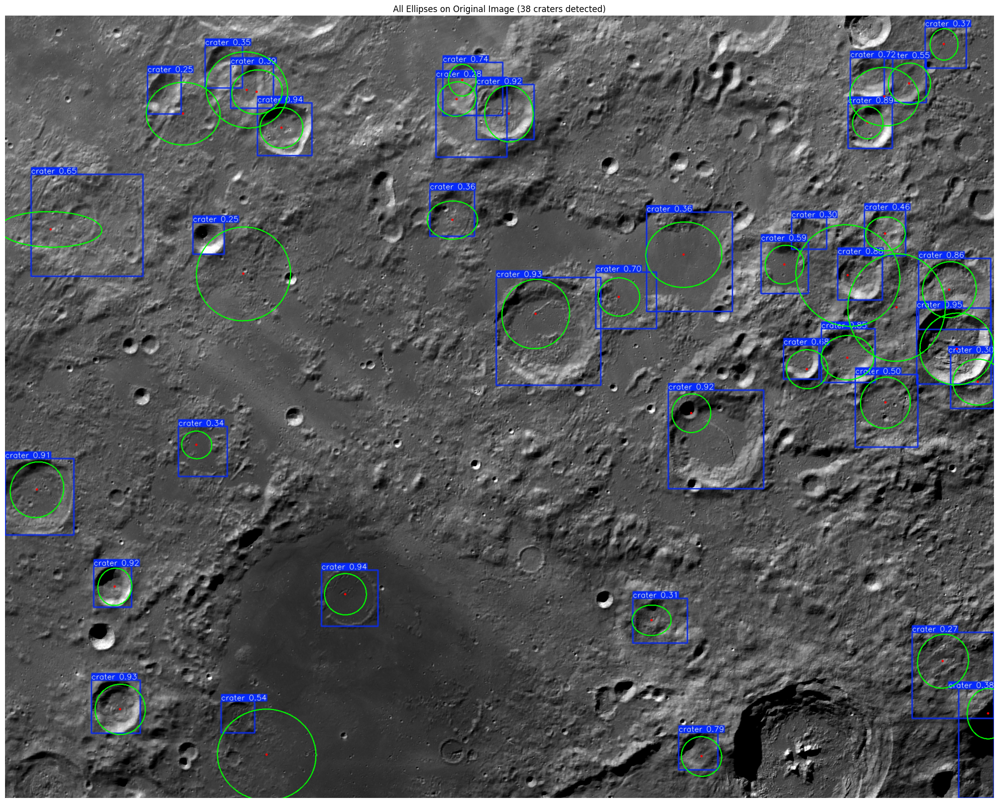

In [1]:
import cv2
import numpy as np
import pandas as pd
import os
from pathlib import Path

# =========================
# PATHS
# =========================
ORIGINAL_IMAGE_PATH = r"D:\datashare\yolo_output\orientation01_light02\orientation01_light02.jpg"
LABELS_PATH = r"D:\datashare\yolo_output\orientation01_light02\labels\orientation01_light02.txt"
CSV_PATH = r"D:\datashare\yolo_output\orientation01_light02\ellipses\ellipse_params.csv"
OUTPUT_PATH = r"D:\datashare\yolo_output\orientation01_light02\final_ellipses_overlay.jpg"

# =========================
# LOAD ORIGINAL IMAGE
# =========================
img = cv2.imread(ORIGINAL_IMAGE_PATH)
if img is None:
    print(f"Error: Could not load image from {ORIGINAL_IMAGE_PATH}")
else:
    img_height, img_width = img.shape[:2]
    print(f"Image size: {img_width} x {img_height}")

    # =========================
    # LOAD YOLO LABELS
    # =========================
    bboxes = []
    with open(LABELS_PATH, 'r') as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) >= 5:
                cls, x_center, y_center, width, height = map(float, parts[:5])
                # Convert from normalized YOLO format to pixel coordinates
                x_center_px = x_center * img_width
                y_center_px = y_center * img_height
                width_px = width * img_width
                height_px = height * img_height
                
                # Calculate top-left corner
                x1 = int(x_center_px - width_px / 2)
                y1 = int(y_center_px - height_px / 2)
                x2 = int(x_center_px + width_px / 2)
                y2 = int(y_center_px + height_px / 2)
                
                bboxes.append({
                    'x1': x1, 'y1': y1, 'x2': x2, 'y2': y2,
                    'width': int(width_px), 'height': int(height_px)
                })

    print(f"Loaded {len(bboxes)} bounding boxes")

    # =========================
    # LOAD ELLIPSE PARAMETERS
    # =========================
    df = pd.read_csv(CSV_PATH)
    print(f"Loaded {len(df)} ellipse parameters")

    # =========================
    # DRAW ELLIPSES ON ORIGINAL IMAGE
    # =========================
    overlay = img.copy()

    for idx, row in df.iterrows():
        if idx < len(bboxes):
            bbox = bboxes[idx]
            
            # Ellipse parameters in crop coordinates
            cx_crop = row['center_x']
            cy_crop = row['center_y']
            semi_major = row['semi_major']
            semi_minor = row['semi_minor']
            angle = row['angle_deg']
            
            # Transform to original image coordinates
            cx_original = bbox['x1'] + cx_crop
            cy_original = bbox['y1'] + cy_crop
            
            # Create ellipse tuple for cv2.ellipse
            ellipse = (
                (cx_original, cy_original),
                (semi_major * 2, semi_minor * 2),  # cv2.ellipse uses full axes, not semi-axes
                angle
            )
            
            # Draw ellipse
            cv2.ellipse(overlay, ellipse, (0, 255, 0), 2)
            
            # Optional: draw center point
            cv2.circle(overlay, (int(cx_original), int(cy_original)), 3, (0, 0, 255), -1)
            
            # Optional: draw bounding box to verify alignment
            # cv2.rectangle(overlay, (bbox['x1'], bbox['y1']), (bbox['x2'], bbox['y2']), (255, 0, 0), 1)

    # =========================
    # SAVE OUTPUT
    # =========================
    cv2.imwrite(OUTPUT_PATH, overlay)
    print(f"\nFinal image with all ellipses saved to: {OUTPUT_PATH}")

    # =========================
    # DISPLAY RESULT
    # =========================
    import matplotlib.pyplot as plt
    
    plt.figure(figsize=(20, 20))
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.title(f"All Ellipses on Original Image ({len(df)} craters detected)")
    plt.axis('off')
    plt.tight_layout()
    plt.show()

Image size: 2592 x 2048
Loaded 38 bounding boxes
Loaded 38 ellipse parameters
Matched orientation01_light02.jpg (size: 209x213) to bbox 35 (size: 214x225)
Matched orientation01_light0210.jpg (size: 128x129) to bbox 30 (size: 128x131)
Matched orientation01_light0211.jpg (size: 129x132) to bbox 4 (size: 128x139)
Matched orientation01_light0212.jpg (size: 203x200) to bbox 0 (size: 195x199)
Matched orientation01_light0213.jpg (size: 153x155) to bbox 1 (size: 148x147)
Matched orientation01_light0214.jpg (size: 115x110) to bbox 15 (size: 111x109)
Matched orientation01_light0215.jpg (size: 170x152) to bbox 16 (size: 159x148)
Matched orientation01_light0216.jpg (size: 123x121) to bbox 27 (size: 117x121)
Matched orientation01_light0217.jpg (size: 171x160) to bbox 14 (size: 157x139)
Matched orientation01_light0218.jpg (size: 105x101) to bbox 13 (size: 103x98)
Matched orientation01_light0219.jpg (size: 309x282) to bbox 18 (size: 293x267)
Matched orientation01_light022.jpg (size: 162x160) to bbox 

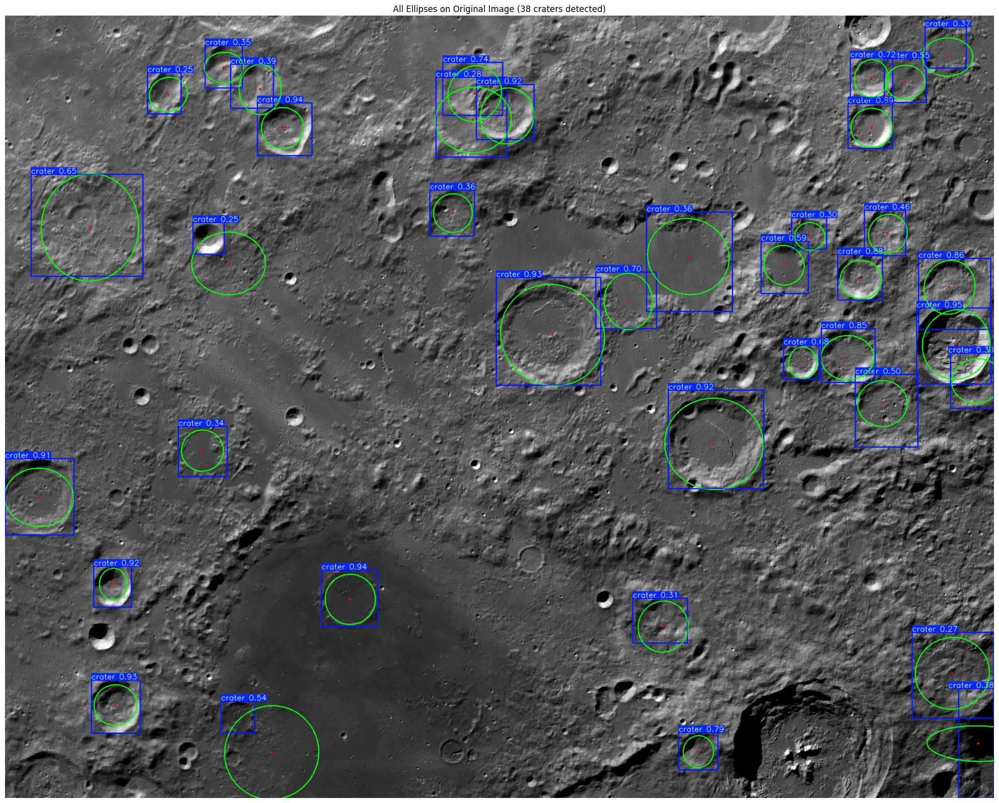

In [2]:
import cv2
import numpy as np
import pandas as pd
import os
from pathlib import Path

# =========================
# PATHS
# =========================
ORIGINAL_IMAGE_PATH = r"D:\datashare\yolo_output\orientation01_light02\orientation01_light02.jpg"
LABELS_PATH = r"D:\datashare\yolo_output\orientation01_light02\labels\orientation01_light02.txt"
CSV_PATH = r"D:\datashare\yolo_output\orientation01_light02\ellipses\ellipse_params.csv"
CROPS_DIR = r"D:\datashare\yolo_output\orientation01_light02\crops\crater"
OUTPUT_PATH = r"D:\datashare\yolo_output\orientation01_light02\final_ellipses_overlay.jpg"

# =========================
# LOAD ORIGINAL IMAGE
# =========================
img = cv2.imread(ORIGINAL_IMAGE_PATH)
if img is None:
    print(f"Error: Could not load image from {ORIGINAL_IMAGE_PATH}")
else:
    img_height, img_width = img.shape[:2]
    print(f"Image size: {img_width} x {img_height}")

    # =========================
    # LOAD YOLO LABELS
    # =========================
    bboxes = []
    with open(LABELS_PATH, 'r') as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) >= 5:
                cls, x_center, y_center, width, height = map(float, parts[:5])
                # Convert from normalized YOLO format to pixel coordinates
                x_center_px = x_center * img_width
                y_center_px = y_center * img_height
                width_px = width * img_width
                height_px = height * img_height
                
                # Calculate top-left corner
                x1 = int(x_center_px - width_px / 2)
                y1 = int(y_center_px - height_px / 2)
                x2 = int(x_center_px + width_px / 2)
                y2 = int(y_center_px + height_px / 2)
                
                bboxes.append({
                    'x1': x1, 'y1': y1, 'x2': x2, 'y2': y2,
                    'width': int(width_px), 'height': int(height_px),
                    'cx': x_center_px, 'cy': y_center_px
                })

    print(f"Loaded {len(bboxes)} bounding boxes")

    # =========================
    # LOAD ELLIPSE PARAMETERS & MATCH TO CROPS
    # =========================
    df = pd.read_csv(CSV_PATH)
    print(f"Loaded {len(df)} ellipse parameters")
    
    # =========================
    # MATCH CROPS TO BBOXES BY SIZE
    # =========================
    crop_to_bbox = {}
    
    for idx, row in df.iterrows():
        crop_name = row['image']
        crop_path = os.path.join(CROPS_DIR, crop_name)
        
        # Load crop to get its dimensions
        crop_img = cv2.imread(crop_path)
        if crop_img is not None:
            crop_h, crop_w = crop_img.shape[:2]
            
            # Find matching bbox by size (with tolerance)
            best_match = None
            min_diff = float('inf')
            
            for bbox_idx, bbox in enumerate(bboxes):
                # Check if this bbox hasn't been matched yet
                if bbox_idx in crop_to_bbox.values():
                    continue
                    
                bbox_w = bbox['x2'] - bbox['x1']
                bbox_h = bbox['y2'] - bbox['y1']
                
                # Calculate difference
                diff = abs(crop_w - bbox_w) + abs(crop_h - bbox_h)
                
                if diff < min_diff:
                    min_diff = diff
                    best_match = bbox_idx
            
            if best_match is not None:
                crop_to_bbox[idx] = best_match
                print(f"Matched {crop_name} (size: {crop_w}x{crop_h}) to bbox {best_match} (size: {bboxes[best_match]['x2']-bboxes[best_match]['x1']}x{bboxes[best_match]['y2']-bboxes[best_match]['y1']})")

    # =========================
    # DRAW ELLIPSES ON ORIGINAL IMAGE
    # =========================
    overlay = img.copy()

    for crop_idx, bbox_idx in crop_to_bbox.items():
        row = df.iloc[crop_idx]
        bbox = bboxes[bbox_idx]
        
        # Ellipse parameters in crop coordinates
        cx_crop = row['center_x']
        cy_crop = row['center_y']
        semi_major = row['semi_major']
        semi_minor = row['semi_minor']
        angle = row['angle_deg']
        
        # Transform to original image coordinates
        cx_original = bbox['x1'] + cx_crop
        cy_original = bbox['y1'] + cy_crop
        
        # Create ellipse tuple for cv2.ellipse
        ellipse = (
            (cx_original, cy_original),
            (semi_major * 2, semi_minor * 2),  # cv2.ellipse uses full axes, not semi-axes
            angle
        )
        
        # Draw ellipse
        cv2.ellipse(overlay, ellipse, (0, 255, 0), 2)
        
        # Optional: draw center point
        cv2.circle(overlay, (int(cx_original), int(cy_original)), 3, (0, 0, 255), -1)
        
        # Optional: draw bounding box to verify alignment
        cv2.rectangle(overlay, (bbox['x1'], bbox['y1']), (bbox['x2'], bbox['y2']), (255, 0, 0), 1)

    # =========================
    # SAVE OUTPUT
    # =========================
    cv2.imwrite(OUTPUT_PATH, overlay)
    print(f"\nFinal image with all ellipses saved to: {OUTPUT_PATH}")
    print(f"Successfully drawn {len(crop_to_bbox)} ellipses")

    # =========================
    # DISPLAY RESULT
    # =========================
    import matplotlib.pyplot as plt
    
    plt.figure(figsize=(20, 20))
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.title(f"All Ellipses on Original Image ({len(crop_to_bbox)} craters detected)")
    plt.axis('off')
    plt.tight_layout()
    plt.show()